This thing uses one window of the input dataset to predict one new entry, it doesn't climb on it's predictions, it generates the same predictions as the input given to it, i.e. it can't predict far future.
 
Number of predictions = aCb/a+b, where a is the length of the dataset, b is the lag (the size of the window).
As far as I can see It's useless in production.
Tomorrow I will create a climbing LSTM that uses 10 days to predict the future 20 days and will use it in production.

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import *
from sklearn.preprocessing import MinMaxScaler

In [2]:
def train_test_split(dataset, split_by=0.7):
    split_to = int(split_by * len(dataset))
    dataset_train = dataset[:split_to]
    dataset_test = dataset[split_to:]
    return dataset_train, dataset_test

In [3]:
def get_mape(y_true, y_predicted):
    y_true, y_predicted = np.array(y_true), np.array(y_predicted)
    mape = np.mean(np.abs((y_true - y_predicted) / y_true)) * 100
    return mape
 
 
def get_rmse(y_true, y_predicted):
    rmse = np.sqrt(np.mean(np.power((y_true - y_predicted), 2)))
    return rmse

In [4]:
def prepare_data(dataset, max_marker=60, lag_marker=50, stride=1):
    data_set = dataset.iloc[:, 1:2].values
    scaler = MinMaxScaler(feature_range=(0, 1))
    data_set_scaled = scaler.fit_transform(data_set)
    x_data_set = []
    y_data_set = []
    for counter in range(max_marker, len(data_set), stride):
        # get a window from min_index to max_index
        x_data_set.append(data_set_scaled[counter - lag_marker:counter, 0])
        y_data_set.append(data_set_scaled[counter, 0])
    x_data_set, y_data_set = np.array(x_data_set), np.array(y_data_set)
    x_data_set = np.reshape(x_data_set, (x_data_set.shape[0], x_data_set.shape[1], 1))
    return x_data_set, y_data_set, scaler

In [5]:
def create_model(x_data_set, y_data_set, lag=50, epochs=50, batch_size=32):
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(lag, 1)))
    model.add(Dropout(0.2))
    model.add(LSTM(units=50, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(units=50, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(units=50))
    model.add(Dropout(0.2))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['MAPE', 'accuracy'])
    model.fit(x_data_set, y_data_set, epochs=epochs, batch_size=batch_size)
    return model

In [6]:
def predict(model, data_set, scaler):
    predicted = model.predict(data_set)
    predicted = scaler.inverse_transform(predicted)
    return predicted

In [7]:
def plot(real_df, predicted_values, max_marker=60, lag_marker=50, title="Real(blue) vs predicted(red)",
         x_label="occurtime", y_label="power", figsize_x=100, figsize_y=60):
    plt.figure(figsize=(figsize_x, figsize_y))
    plt.xticks(np.arange(0, len(real_df) - max_marker, lag_marker))
    plt.plot(real_df[x_label], real_df[y_label], color='blue', label='Real')
    plt.plot(real_df[x_label], predicted_values, color='red', label='predicted')
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.legend(["Real values", "Predicted values"], loc="upper left")
 
    return plt.show()

In [8]:
def predict_two_datasets(train_path, test_path, max_marker=60, lag=50, epochs=50, batch_size=32,
                         title="Real(blue) vs predicted(red)", x_label="occurtime", y_label="power"):
    df_train = pd.read_csv(train_path)
    x_train_data_set, y_train_data_set, scaler = prepare_data(df_train, max_marker, lag)
 
    model = create_model(x_train_data_set, y_train_data_set, lag=lag, epochs=epochs, batch_size=batch_size)
 
    df_test = pd.read_csv(test_path)
    x_test_data_set, y_test_data_set, scaler = prepare_data(df_test, max_marker, lag)
 
    y_predicted = predict(model, x_test_data_set, scaler).flatten()
 
    print('MAPE: ', get_mape(y_test_data_set, y_predicted))
    print('RMSE: ', get_rmse(y_test_data_set, y_predicted))
 
    predicted_values = y_predicted.flatten()
    real_df = df_test[:len(predicted_values)]
 
    plot(real_df, y_predicted, max_marker=max_marker, lag_marker=lag, title=title,
         x_label=x_label, y_label=y_label)

In [9]:
def predict_one_dataset(path1, split_by=0.7, max_marker=60, lag=50, epochs=50, batch_size=32,
                        title="Real(blue) vs predicted(red)", x_label="occurtime", y_label="power"):
    df_total = pd.read_csv(path1)
    df_train, df_test = train_test_split(df_total, split_by)
    x_train_data_set, y_train_data_set, scaler = prepare_data(df_train, max_marker, lag)
 
    model = create_model(x_train_data_set, y_train_data_set, lag=lag, epochs=epochs, batch_size=batch_size)
 
    x_test_data_set, y_test_data_set, scaler = prepare_data(df_test, max_marker, lag)
    y_predicted = predict(model, x_test_data_set, scaler).flatten()
 
    print('MAPE: ', get_mape(y_test_data_set, y_predicted))
    print('RMSE: ', get_rmse(y_test_data_set, y_predicted))
 
    predicted_values = y_predicted.flatten()
    real_df = df_test[:len(predicted_values)]
 
    plot(real_df, y_predicted, max_marker=max_marker, lag_marker=lag, title=title,
         x_label=x_label, y_label=y_label)

In [16]:
def create_model_2(x_data_set, y_data_set, lag=50, epochs=50, batch_size=32):
    model = Sequential()
    model.add(LSTM(units=200, return_sequences=True, input_shape=(lag, 1)))
    model.add(LSTM(units=200, return_sequences=True))
    model.add(LSTM(units=200))
    model.add(Dropout(0.1))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['MAPE', 'accuracy'])
    model.fit(x_data_set, y_data_set, epochs=epochs, batch_size=batch_size)
    return model

Epoch 1/50
102/102 [==============================] - 81s 748ms/step - loss: 0.0312 - MAPE: 70974853.8753 - accuracy: 0.3969
Epoch 2/50
102/102 [==============================] - 76s 747ms/step - loss: 0.0212 - MAPE: 58021600.8932 - accuracy: 0.3993
Epoch 3/50
102/102 [==============================] - 77s 751ms/step - loss: 0.0159 - MAPE: 44977963.5340 - accuracy: 0.4022
Epoch 4/50
102/102 [==============================] - 77s 750ms/step - loss: 0.0156 - MAPE: 42042576.4272 - accuracy: 0.4024
Epoch 5/50
102/102 [==============================] - 77s 752ms/step - loss: 0.0129 - MAPE: 38052714.0000 - accuracy: 0.3986
Epoch 6/50
102/102 [==============================] - 77s 754ms/step - loss: 0.0135 - MAPE: 39150457.4369 - accuracy: 0.4171
Epoch 7/50
102/102 [==============================] - 77s 754ms/step - loss: 0.0125 - MAPE: 38118108.0583 - accuracy: 0.4191
Epoch 8/50
102/102 [==============================] - 77s 755ms/step - loss: 0.0123 - MAPE: 37699155.7476 - accuracy: 0.3987


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


MAPE:  inf
RMSE:  80.26628637339762


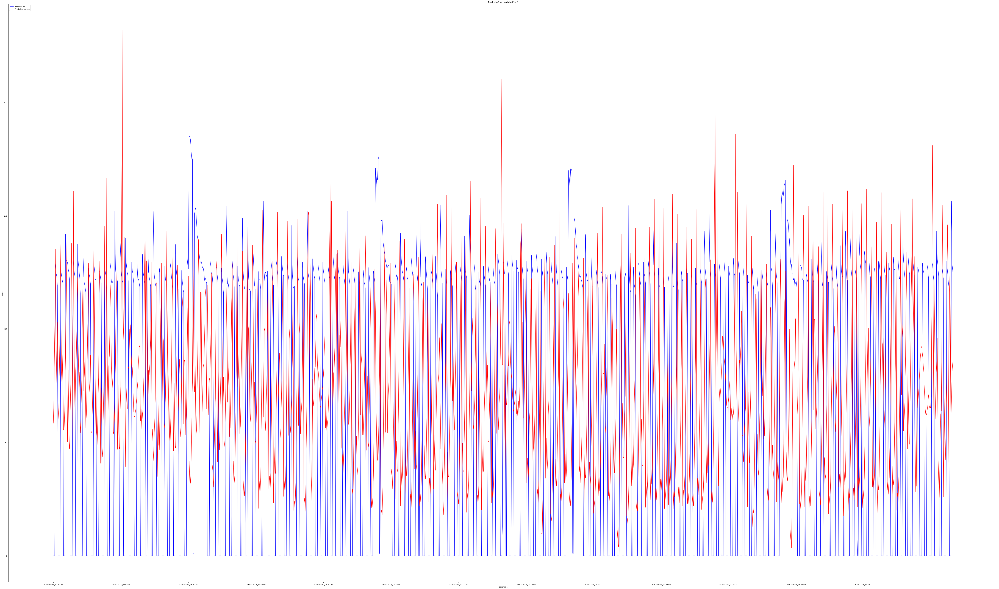

In [17]:

split_by=0.7
max_marker=100
lag=100
epochs=50
batch_size=32
title="Real(blue) vs predicted(red)"
x_label="occurtime"
y_label="power"

df_total = pd.read_csv("MyFridge.csv")
df_train, df_test = train_test_split(df_total, split_by)
x_train_data_set, y_train_data_set, scaler = prepare_data(df_train, max_marker, lag)
 
model = create_model_2(x_train_data_set, y_train_data_set, lag=lag, epochs=epochs, batch_size=batch_size)
 
x_test_data_set, y_test_data_set, scaler = prepare_data(df_test, max_marker, lag)
y_predicted = predict(model, x_test_data_set, scaler).flatten()
 
print('MAPE: ', get_mape(y_test_data_set, y_predicted))
print('RMSE: ', get_rmse(y_test_data_set, y_predicted))
 
predicted_values = y_predicted.flatten()
real_df = df_test[:len(predicted_values)]
 
plot(real_df, y_predicted, max_marker=max_marker, lag_marker=lag, title=title, x_label=x_label, y_label=y_label)

================================================================================

Epoch 1/50
99/99 [==============================] - 12s 72ms/step - loss: 0.1665 - MAPE: 82595222.5650 - accuracy: 0.0417
Epoch 2/50
99/99 [==============================] - 7s 72ms/step - loss: 0.0988 - MAPE: 108594750.2400 - accuracy: 0.0027
Epoch 3/50
99/99 [==============================] - 7s 73ms/step - loss: 0.0848 - MAPE: 93233511.2000 - accuracy: 0.0096
Epoch 4/50
99/99 [==============================] - 7s 74ms/step - loss: 0.0799 - MAPE: 87342125.4400 - accuracy: 0.0132
Epoch 5/50
99/99 [==============================] - 7s 74ms/step - loss: 0.0812 - MAPE: 92751588.4800 - accuracy: 0.0208
Epoch 6/50
99/99 [==============================] - 7s 75ms/step - loss: 0.0788 - MAPE: 88056792.6800 - accuracy: 0.0228
Epoch 7/50
99/99 [==============================] - 8s 76ms/step - loss: 0.0693 - MAPE: 79866463.0000 - accuracy: 0.0446
Epoch 8/50
99/99 [==============================] - 8s 76ms/step - loss: 0.0530 - MAPE: 65251246.9600 - accuracy: 0.1101
Epoch 9/50
99/99 [============

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


MAPE:  inf
RMSE:  83.21417859805665


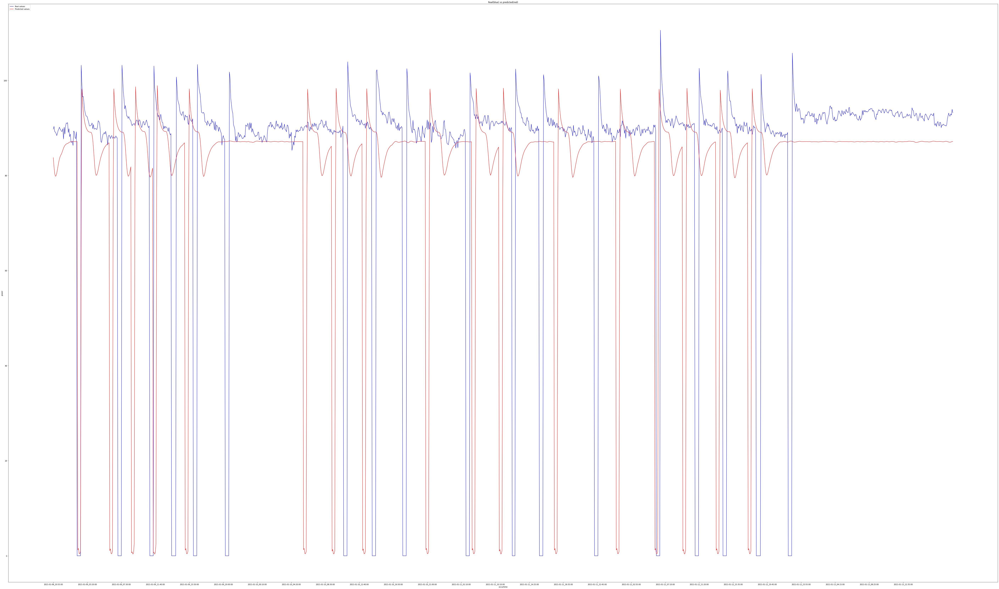

In [ ]:
predict_one_dataset("My Deep Freezer.csv")

Epoch 1/50
67/67 [==============================] - 13s 92ms/step - loss: 0.0137 - MAPE: 1166370.1872 - accuracy: 0.0569
Epoch 2/50
67/67 [==============================] - 7s 98ms/step - loss: 0.0175 - MAPE: 826913.6645 - accuracy: 0.0500
Epoch 3/50
67/67 [==============================] - 7s 99ms/step - loss: 0.0141 - MAPE: 657927.0841 - accuracy: 0.0623
Epoch 4/50
67/67 [==============================] - 7s 98ms/step - loss: 0.0095 - MAPE: 1215390.6094 - accuracy: 0.0696
Epoch 5/50
67/67 [==============================] - 7s 98ms/step - loss: 0.0147 - MAPE: 667852.1567 - accuracy: 0.0470
Epoch 6/50
67/67 [==============================] - 7s 98ms/step - loss: 0.0124 - MAPE: 692743.5850 - accuracy: 0.0523
Epoch 7/50
67/67 [==============================] - 7s 98ms/step - loss: 0.0177 - MAPE: 745061.0239 - accuracy: 0.0528
Epoch 8/50
67/67 [==============================] - 7s 98ms/step - loss: 0.0127 - MAPE: 720864.2006 - accuracy: 0.0489
Epoch 9/50
67/67 [===========================

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


MAPE:  inf
RMSE:  158.18194841556206


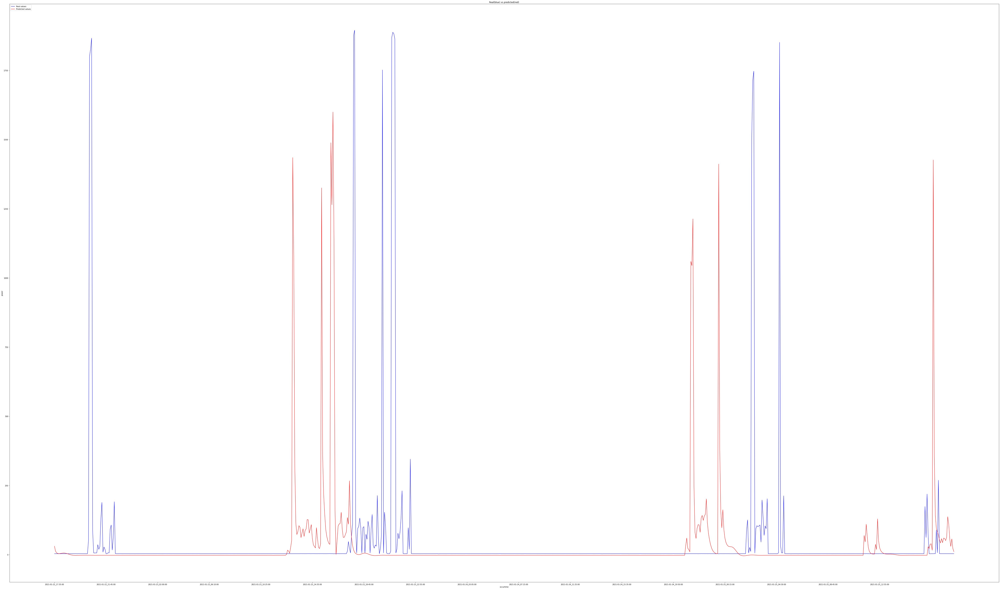

In [ ]:
predict_one_dataset("My Washer.csv")

Epoch 1/50
103/103 [==============================] - 15s 93ms/step - loss: 0.0330 - MAPE: 68312315.7356 - accuracy: 0.4076
Epoch 2/50
103/103 [==============================] - 10s 94ms/step - loss: 0.0278 - MAPE: 76422137.0000 - accuracy: 0.4160
Epoch 3/50
103/103 [==============================] - 10s 94ms/step - loss: 0.0269 - MAPE: 78168312.3846 - accuracy: 0.4271
Epoch 4/50
103/103 [==============================] - 10s 95ms/step - loss: 0.0243 - MAPE: 69165663.4231 - accuracy: 0.4109
Epoch 5/50
103/103 [==============================] - 10s 96ms/step - loss: 0.0210 - MAPE: 56521074.5000 - accuracy: 0.4190
Epoch 6/50
103/103 [==============================] - 10s 96ms/step - loss: 0.0167 - MAPE: 46706467.9231 - accuracy: 0.3997
Epoch 7/50
103/103 [==============================] - 10s 97ms/step - loss: 0.0162 - MAPE: 45363735.7308 - accuracy: 0.4103
Epoch 8/50
103/103 [==============================] - 10s 96ms/step - loss: 0.0163 - MAPE: 42445465.1538 - accuracy: 0.4176
Epoch 9/

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


MAPE:  inf
RMSE:  48.65075575446727


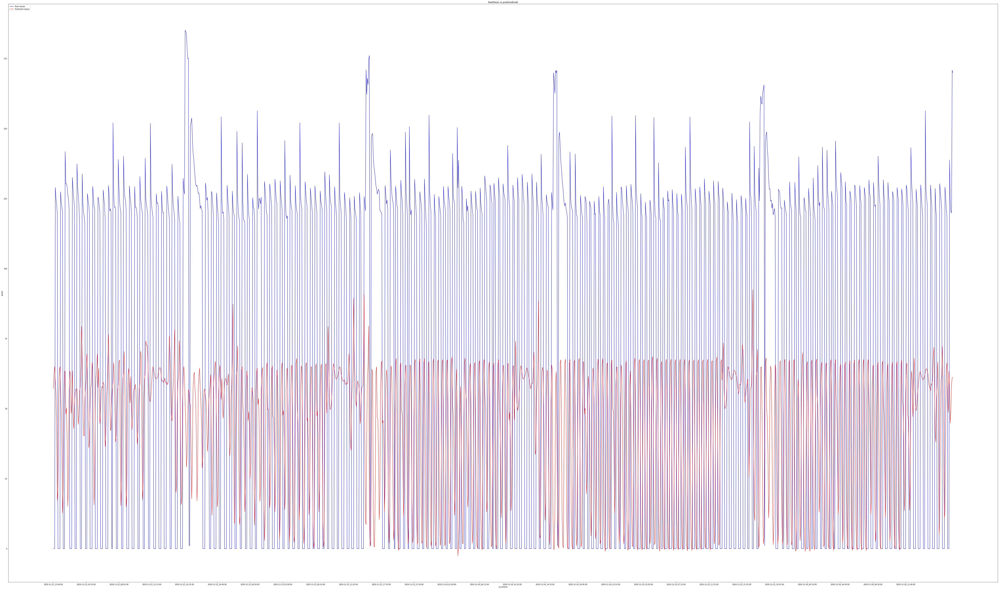

In [ ]:
predict_one_dataset("MyFridge.csv")

Epoch 1/50
39/39 [==============================] - 9s 91ms/step - loss: 0.1726 - MAPE: 123111005.6875 - accuracy: 0.3642
Epoch 2/50
39/39 [==============================] - 4s 93ms/step - loss: 0.1274 - MAPE: 164544457.4000 - accuracy: 0.4007
Epoch 3/50
39/39 [==============================] - 4s 92ms/step - loss: 0.1275 - MAPE: 169486176.4000 - accuracy: 0.4169
Epoch 4/50
39/39 [==============================] - 4s 94ms/step - loss: 0.1251 - MAPE: 160656423.8000 - accuracy: 0.4114
Epoch 5/50
39/39 [==============================] - 4s 92ms/step - loss: 0.1229 - MAPE: 159349870.8000 - accuracy: 0.4036
Epoch 6/50
39/39 [==============================] - 4s 94ms/step - loss: 0.1273 - MAPE: 164676958.4000 - accuracy: 0.4062
Epoch 7/50
39/39 [==============================] - 4s 92ms/step - loss: 0.1148 - MAPE: 161665617.2000 - accuracy: 0.4231
Epoch 8/50
39/39 [==============================] - 4s 92ms/step - loss: 0.0810 - MAPE: 106762442.8000 - accuracy: 0.4000
Epoch 9/50
39/39 [======

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


MAPE:  inf
RMSE:  88.02949190664717


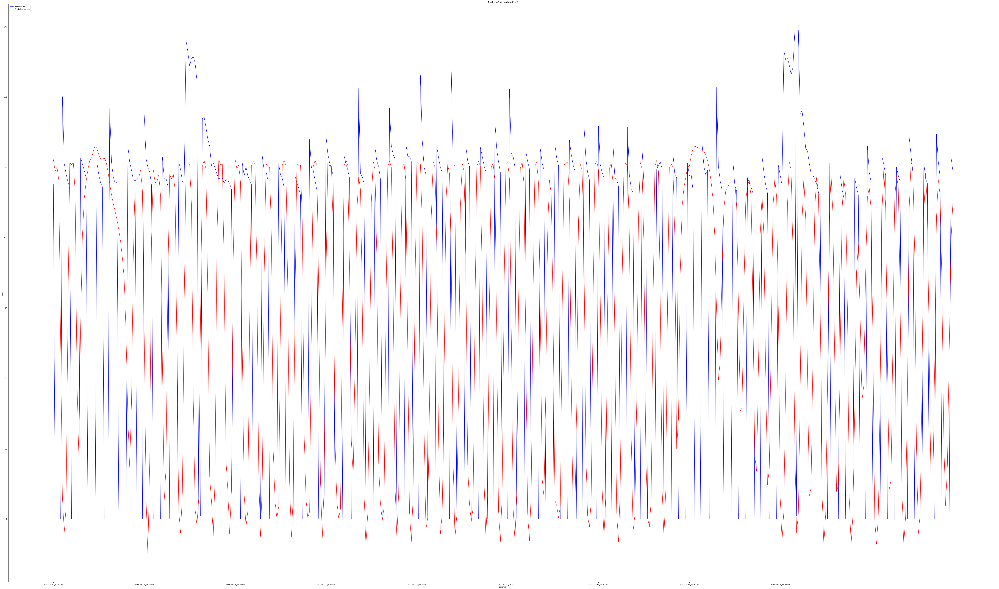

In [ ]:
predict_one_dataset("MyFridge2.csv")

Epoch 1/50
92/92 [==============================] - 14s 91ms/step - loss: 0.0313 - MAPE: 41460096.2097 - accuracy: 0.8996
Epoch 2/50
92/92 [==============================] - 9s 95ms/step - loss: 0.0336 - MAPE: 44070763.9140 - accuracy: 0.9010
Epoch 3/50
92/92 [==============================] - 9s 95ms/step - loss: 0.0305 - MAPE: 43121441.4194 - accuracy: 0.8995
Epoch 4/50
92/92 [==============================] - 9s 94ms/step - loss: 0.0317 - MAPE: 41637020.3871 - accuracy: 0.9010
Epoch 5/50
92/92 [==============================] - 9s 95ms/step - loss: 0.0323 - MAPE: 43369855.8710 - accuracy: 0.8895
Epoch 6/50
92/92 [==============================] - 9s 94ms/step - loss: 0.0318 - MAPE: 49057583.7419 - accuracy: 0.9007
Epoch 7/50
92/92 [==============================] - 9s 96ms/step - loss: 0.0321 - MAPE: 43816053.0753 - accuracy: 0.8967
Epoch 8/50
92/92 [==============================] - 9s 94ms/step - loss: 0.0279 - MAPE: 43307071.7849 - accuracy: 0.9087
Epoch 9/50
92/92 [=============

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


MAPE:  inf
RMSE:  72.37666448642763


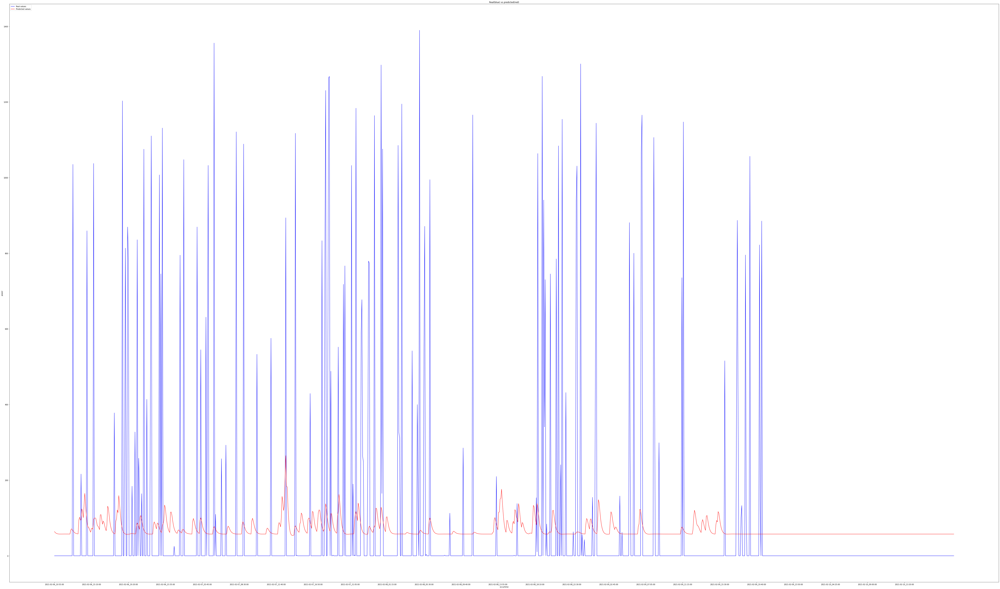

In [ ]:
predict_one_dataset("MyWaterPump.csv")

Epoch 1/50
26/26 [==============================] - 8s 90ms/step - loss: 0.1119 - MAPE: 679806.2948 - accuracy: 0.0014
Epoch 2/50
26/26 [==============================] - 2s 92ms/step - loss: 0.0204 - MAPE: 962784.2588 - accuracy: 0.0038
Epoch 3/50
26/26 [==============================] - 2s 93ms/step - loss: 0.0153 - MAPE: 44978.3682 - accuracy: 0.0026
Epoch 4/50
26/26 [==============================] - 2s 91ms/step - loss: 0.0119 - MAPE: 205186.7880 - accuracy: 0.0012
Epoch 5/50
26/26 [==============================] - 2s 94ms/step - loss: 0.0143 - MAPE: 73531.1979 - accuracy: 0.0036
Epoch 6/50
26/26 [==============================] - 2s 93ms/step - loss: 0.0127 - MAPE: 28833.5637 - accuracy: 2.2674e-04
Epoch 7/50
26/26 [==============================] - 2s 93ms/step - loss: 0.0133 - MAPE: 358883.3302 - accuracy: 0.0057
Epoch 8/50
26/26 [==============================] - 2s 93ms/step - loss: 0.0115 - MAPE: 32764.0624 - accuracy: 0.0011
Epoch 9/50
26/26 [==============================

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


MAPE:  inf
RMSE:  100.49364196858156


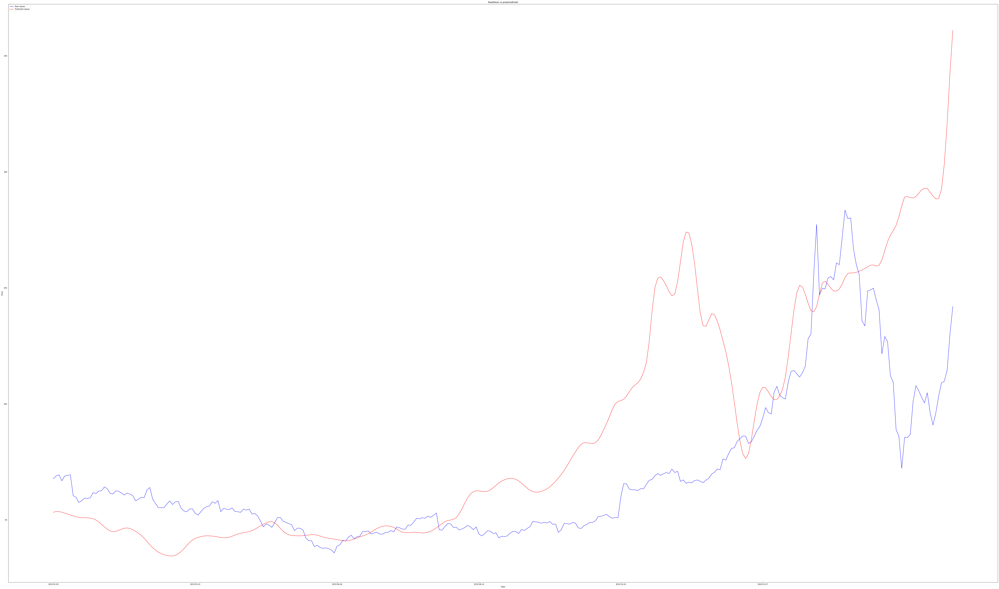

In [ ]:
predict_one_dataset("TSLA.csv",x_label="Date",y_label="Close")

Epoch 1/50
26/26 [==============================] - 8s 93ms/step - loss: 0.0989 - MAPE: 86646.9448 - accuracy: 0.0036
Epoch 2/50
26/26 [==============================] - 2s 91ms/step - loss: 0.0066 - MAPE: 81626.7531 - accuracy: 0.0044
Epoch 3/50
26/26 [==============================] - 2s 91ms/step - loss: 0.0052 - MAPE: 294013.7443 - accuracy: 0.0038
Epoch 4/50
26/26 [==============================] - 2s 93ms/step - loss: 0.0047 - MAPE: 113526.2431 - accuracy: 0.0031
Epoch 5/50
26/26 [==============================] - 2s 94ms/step - loss: 0.0047 - MAPE: 22765.6823 - accuracy: 4.2442e-04
Epoch 6/50
26/26 [==============================] - 2s 92ms/step - loss: 0.0058 - MAPE: 161835.8052 - accuracy: 0.0030
Epoch 7/50
26/26 [==============================] - 2s 92ms/step - loss: 0.0062 - MAPE: 10211.3067 - accuracy: 0.0013
Epoch 8/50
26/26 [==============================] - 2s 93ms/step - loss: 0.0042 - MAPE: 81565.2574 - accuracy: 0.0014
Epoch 9/50
26/26 [==============================]

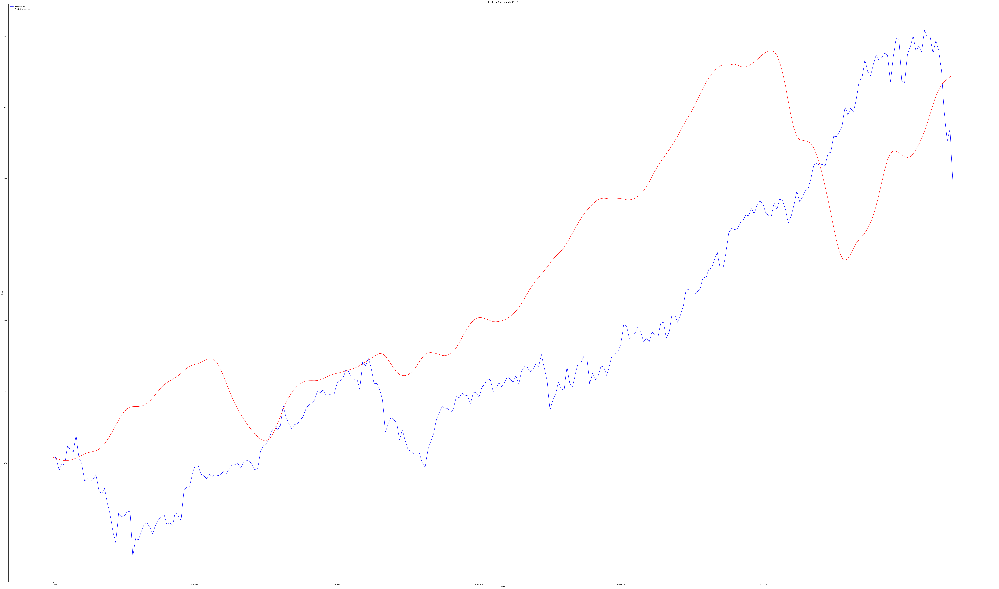

In [ ]:
predict_one_dataset("AAPL.csv",x_label="date",y_label="close")